In [ ]:
#@title Required Installations
!pip install swig
!pip install gymnasium
!pip install mujoco
!pip install gymnasium[mujoco]
!pip install stable-baselines3[extra]
!pip install stable_baselines3

In [ ]:
#@title Import packages for plotting and creating graphics
import time
import itertools
import numpy as np
from typing import Callable, NamedTuple, Optional, Union, List

# Graphics and plotting.
print('Installing mediapy:')

!pip install -q mediapy
import mediapy as media
import matplotlib.pyplot as plt

# More legible printing from numpy.
np.set_printoptions(precision=3, suppress=True, linewidth=100)

Installing mediapy:


In [ ]:
import gymnasium as gym
import stable_baselines3
import mujoco
%load_ext tensorboard
import numpy as np
import matplotlib.pyplot as plt

from stable_baselines3 import PPO, DQN
from stable_baselines3.common.callbacks import BaseCallback
from stable_baselines3.common.results_plotter import load_results, ts2xy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.evaluation import evaluate_policy
env = gym.make('CartPole-v1', render_mode="rgb_array")


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# CARTPOLE USING DQN AND PPO

In [ ]:


class RewardLogger(BaseCallback):
    def __init__(self, check_freq: int, log_dir: str, verbose=1):
        super(RewardLogger, self).__init__(verbose)
        self.check_freq = check_freq
        self.log_dir = log_dir
        self.rewards = []

    def _on_step(self) -> bool:
        if self.n_calls % self.check_freq == 0:
            x, y = ts2xy(load_results(self.log_dir), 'timesteps')
            if len(x) > 0:
                mean_reward = np.mean(y[-100:])
                self.rewards.append(mean_reward)
        return True

log_dir_dqn = "./tensorboard_logs_dqn/"
log_dir_ppo = "./tensorboard_logs_ppo/"


# Monitor wrappers to record stats
env_dqn = Monitor(env, log_dir_dqn)
env_ppo = Monitor(env, log_dir_ppo)






# PLOTTING AND VIDEO

In [ ]:
# Train DQN
model_dqn = DQN("MlpPolicy", env_dqn, verbose=1, tensorboard_log=log_dir_dqn)
callback_dqn = RewardLogger(check_freq=1000, log_dir=log_dir_dqn)
model_dqn.learn(total_timesteps=100000, callback=callback_dqn)
model_dqn.save('cart-dqn')



Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ./tensorboard_logs_dqn/DQN_8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 22.8     |
|    ep_rew_mean      | 22.8     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 9027     |
|    time_elapsed     | 0        |
|    total_timesteps  | 91       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 20.1     |
|    ep_rew_mean      | 20.1     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 9369     |
|    time_elapsed     | 0        |
|    total_timesteps  | 161      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 20.9     |
|    ep_rew_mean      | 20.9     

In [ ]:
# Train PPO
model_ppo = PPO("MlpPolicy", env_ppo, verbose=1, tensorboard_log=log_dir_ppo)
callback_ppo = RewardLogger(check_freq=1000, log_dir=log_dir_ppo)
model_ppo.learn(total_timesteps=100000, callback=callback_ppo)
model_ppo.save('cart-ppo')

Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ./tensorboard_logs_ppo/PPO_4
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 23.1     |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    fps             | 2068     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 28.9        |
|    ep_rew_mean          | 28.9        |
| time/                   |             |
|    fps                  | 1463        |
|    iterations           | 2           |
|    time_elapsed         | 2           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.008664872 |
|    clip_fraction        | 0.0963      |
|    clip_range           | 0.2         |
|    entropy_loss     

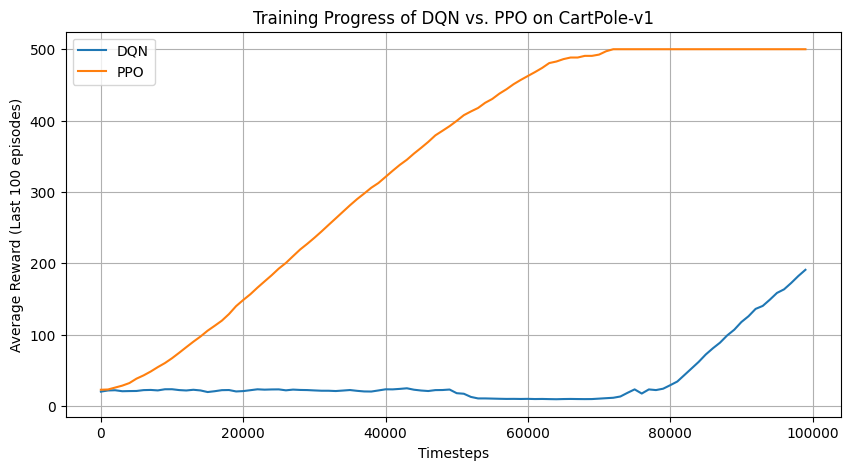

In [ ]:
# Plotting
plt.figure(figsize=(10,5))
plt.plot(np.arange(len(callback_dqn.rewards)) * callback_dqn.check_freq, callback_dqn.rewards, label='DQN')
plt.plot(np.arange(len(callback_ppo.rewards)) * callback_ppo.check_freq, callback_ppo.rewards, label='PPO')
plt.xlabel('Timesteps')
plt.ylabel('Average Reward (Last 100 episodes)')
plt.title('Training Progress of DQN vs. PPO on CartPole-v1')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
model=DQN.load('cart-dqn.zip')
obs,info = env.reset()
duration = 5  # seconds
framerate = 60  # FPS

frames = []
for _ in range(duration * framerate):
    action, _states = model.predict(obs)
    obs, reward, terminated, truncated, info= env.step(action)
    frame = env.render()
    frames.append(frame)

    if terminated or truncated:
      observation, info = env.reset()

env.close()

# Show the video of the trained agent
import mediapy as media


###USING DQN
media.show_video(frames, fps=60)


########################################################################

model=PPO.load('cart-ppo.zip')
obs,info = env.reset()
duration = 5  # seconds
framerate = 60  # FPS

frames1 = []
for _ in range(duration * framerate):
    action, _states = model.predict(obs)
    obs, reward, terminated, truncated, info= env.step(action)
    frame = env.render()
    frames1.append(frame)

    if terminated or truncated:
      observation, info = env.reset()

env.close()

# Show the video of the trained agent
import mediapy as media


###USING DQN
media.show_video(frames1, fps=60)


## HUMANOID USING PPO AND SAC

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines3 import PPO, DQN
from stable_baselines3.common.callbacks import BaseCallback
from stable_baselines3.common.results_plotter import load_results, ts2xy
from stable_baselines3 import DDPG, SAC
from stable_baselines3.common.noise import NormalActionNoise, OrnsteinUhlenbeckActionNoise
from stable_baselines3.her import HerReplayBuffer

env = gym.make('Humanoid-v4', render_mode="rgb_array")

class RewardLogger(BaseCallback):
    def __init__(self, check_freq: int, log_dir: str, verbose=1):
        super(RewardLogger, self).__init__(verbose)
        self.check_freq = check_freq
        self.log_dir = log_dir
        self.rewards = []

    def _on_step(self) -> bool:
        if self.n_calls % self.check_freq == 0:
            x, y = ts2xy(load_results(self.log_dir), 'timesteps')
            if len(x) > 0:
                mean_reward = np.mean(y[-100:])
                self.rewards.append(mean_reward)
        return True


log_dir_ppo_humanoid = "/Model_Human/logs/"
log_dir_sac ="/Models_Human/logs"



# Monitor wrappers to record stats
env_sac = Monitor(env, log_dir_sac)
env_ppo_humanoid = Monitor(env, log_dir_ppo_humanoid)












In [ ]:

#TRAIN SAC
model_sac = SAC("MlpPolicy",env_sac, buffer_size=int(1e5), verbose=1,tensorboard_log=log_dir_sac)
callback_sac = RewardLogger(check_freq=1000, log_dir=log_dir_sac)
model_sac.learn(total_timesteps=150000, callback=callback_sac)
model_sac.save('human-sac')


Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to /Models_Human/logs\SAC_4
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 24.8     |
|    ep_rew_mean     | 127      |
| time/              |          |
|    episodes        | 4        |
|    fps             | 1438     |
|    time_elapsed    | 0        |
|    total_timesteps | 99       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 23.9     |
|    ep_rew_mean     | 119      |
| time/              |          |
|    episodes        | 8        |
|    fps             | 65       |
|    time_elapsed    | 2        |
|    total_timesteps | 191      |
| train/             |          |
|    actor_loss      | -23      |
|    critic_loss     | 25.8     |
|    ent_coef        | 0.973    |
|    ent_coef_loss   | -0.744   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90       |
----------------------------

In [ ]:

# Train PPO
model_ppo_humanoid = PPO("MlpPolicy", env_ppo_humanoid, verbose=1, tensorboard_log=log_dir_ppo_humanoid)
callback_ppo_humanoid = RewardLogger(check_freq=1000, log_dir=log_dir_ppo_humanoid)
model_ppo_humanoid.learn(total_timesteps=1000000, callback=callback_ppo_humanoid)
model_ppo_humanoid.save('human-ppo')

Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to /Model_Human/logs/PPO_2
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 22.6     |
|    ep_rew_mean     | 110      |
| time/              |          |
|    fps             | 1249     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 23          |
|    ep_rew_mean          | 112         |
| time/                   |             |
|    fps                  | 942         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.018616574 |
|    clip_fraction        | 0.212       |
|    clip_range           | 0.2         |
|    entropy_loss         |

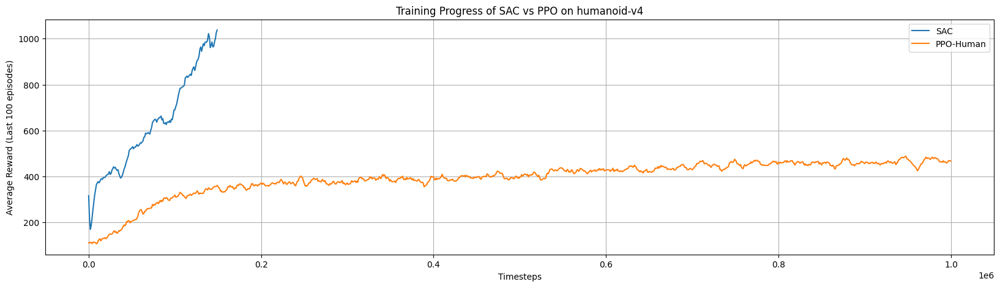

In [ ]:
# Plotting
plt.figure(figsize=(20,5))
plt.plot(np.arange(len(callback_sac.rewards)) * callback_sac.check_freq, callback_sac.rewards, label='SAC')
plt.plot(np.arange(len(callback_ppo_humanoid.rewards)) * callback_ppo_humanoid.check_freq, callback_ppo_humanoid.rewards, label='PPO-Human')
plt.xlabel('Timesteps')
plt.ylabel('Average Reward (Last 100 episodes)')
plt.title('Training Progress of SAC vs PPO on humanoid-v4')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:

model3=SAC.load('human-sac')

observation, info = env.reset(seed=42)

duaration = 5 # time - seconds
framerate = 60 # FPS

frames2 = []
frames3 = [] # Empty list to append frames to

for _ in range(700):
   action, _states = model3.predict(observation)  # this is where you would insert your policy
   observation, reward, terminated, truncated, info = env.step(action)
   px = env.render()
   frames2.append(px)

  #  media.show_image(env.render())
   if terminated or truncated:
      observation, info = env.reset()

env.close()



media.show_video(frames2, fps=60)






In [ ]:

model1=PPO.load('human-ppo')

observation, info = env.reset(seed=42)

duaration = 5 # time - seconds
framerate = 60 # FPS


frames3 = [] # Empty list to append frames to

for _ in range(700):
   action, _states = model1.predict(observation)  # this is where you would insert your policy
   observation, reward, terminated, truncated, info = env.step(action)
   px = env.render()
   frames3.append(px)

  #  media.show_image(env.render())
   if terminated or truncated:
      observation, info = env.reset()

env.close()



media.show_video(frames3, fps=60)



In [ ]:
### model trained for 500k steps
model4=SAC.load('human-sac1.zip')

observation, info = env.reset(seed=42)

duaration = 5 # time - seconds
framerate = 60 # FPS


frames4 = [] # Empty list to append frames to

for _ in range(700):
   action, _states = model4.predict(observation)  # this is where you would insert your policy
   observation, reward, terminated, truncated, info = env.step(action)
   px = env.render()
   frames4.append(px)

  #  media.show_image(env.render())
   if terminated or truncated:
      observation, info = env.reset()

env.close()



media.show_video(frames4, fps=60)



C:\Users\ozapa\anaconda3\envs\my_rl_env\Lib\site-packages\stable_baselines3\common\buffers.py:231: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 6.09GB > 4.81GB
  warnings.warn(
